### Google Drive Bağlantısı

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Dosyaları Zipten Çıkarma

In [ ]:
!cd content
!unzip /content/drive/MyDrive/yolo/yolov3/data_f1.zip

### Kurulumlar

In [5]:
!git clone https://github.com/ultralytics/yolov3
!cd /content/yolov3/
!pip install -r /content/yolov3/requirements.txt

fatal: destination path 'yolov3' already exists and is not an empty directory.


### Ağırlıkları İndirme

In [6]:
# ağırlıkları indirme
%cd /content/yolov3/
!wget https://github.com/ultralytics&/yolov3/releases/download/v9.6.0/yolov3.pt

/content/yolov3
/bin/bash: line 1: /yolov3/releases/download/v9.6.0/yolov3.pt: No such file or directory
--2026-01-12 12:35:48--  https://github.com/ultralytics
Resolving github.com (github.com)... 140.82.113.4
Connecting to github.com (github.com)|140.82.113.4|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘ultralytics’

ultralytics             [ <=>                ] 304.59K  --.-KB/s    in 0.05s   

2026-01-12 12:35:49 (6.07 MB/s) - ‘ultralytics’ saved [311901]



In [14]:
yaml_content = """
train: /content/data_f1/images/train
val: /content/data_f1/images/val

# number of classes
nc: 4

# class names
names: ['Ferrari','Mclaren','Mercedes','Redbull']
"""

with open('/content/yolov3/custom.yaml', 'w') as f:
    f.write(yaml_content)

print("custom.yaml updated successfully.")

custom.yaml updated successfully.


### Eğitim

In [15]:
!python /content/yolov3/train.py --img 640 --batch 4 --epochs 50 --data /content/yolov3/custom.yaml --weights yolov3.pt --patience 5 --device 0

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2026-01-12 12:51:11.449168: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1768222271.472217    6573 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1768222271.479126    6573 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1768222271.496412    6573 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1768222271.496439    6573 computation_placer.cc:177] computation placer already registere

### Test

In [17]:
!python /content/yolov3/val.py --weights /content/yolov3/runs/train/exp4/weights/last.pt --data /content/yolov3/custom.yaml  --img 640

val: data=/content/yolov3/custom.yaml, weights=['/content/yolov3/runs/train/exp4/weights/last.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv3 🚀 v9.6.0-290-g83804a17 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 190 layers, 61513585 parameters, 0 gradients, 154.6 GFLOPs
val: Scanning /content/data_f1/labels/val.cache... 78 images, 0 backgrounds, 0 corrupt: 100% 78/78 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 3/3 [00:03<00:00,  1.26s/it]
                   all         78        128      0.961      0.918      0.948      0.642
               Ferrari         78         31          1      0.984      0.995      0.692
             

### Tensorboard

In [19]:
%load_ext tensorboard
%tensorboard --logdir /content/yolov3/runs/train/exp4

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

### Resim Üzerinden Test

In [21]:
!python detect.py --weights /content/yolov3/runs/train/exp4/weights/last.pt --source /content/data_f1/images/val/scene17901.jpg --conf-thres 0.50

detect: weights=['/content/yolov3/runs/train/exp4/weights/last.pt'], source=/content/data_f1/images/val/scene17901.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv3 🚀 v9.6.0-290-g83804a17 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 190 layers, 61513585 parameters, 0 gradients, 154.6 GFLOPs
image 1/1 /content/data_f1/images/val/scene17901.jpg: 384x640 1 Mclaren, 1 Mercedes, 50.3ms
Speed: 0.5ms pre-process, 50.3ms inference, 88.4ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp2


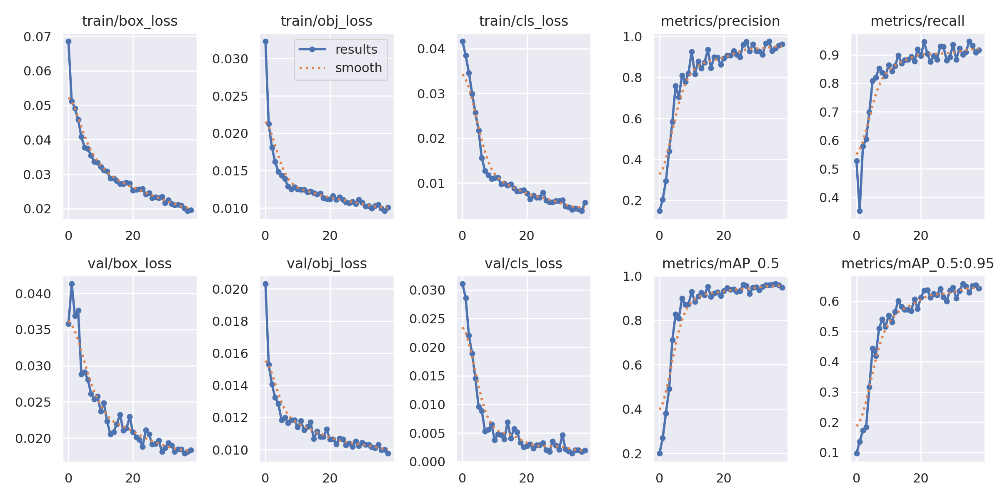

In [23]:
from IPython.display import Image

Image(filename='/content/yolov3/runs/train/exp4/results.png')

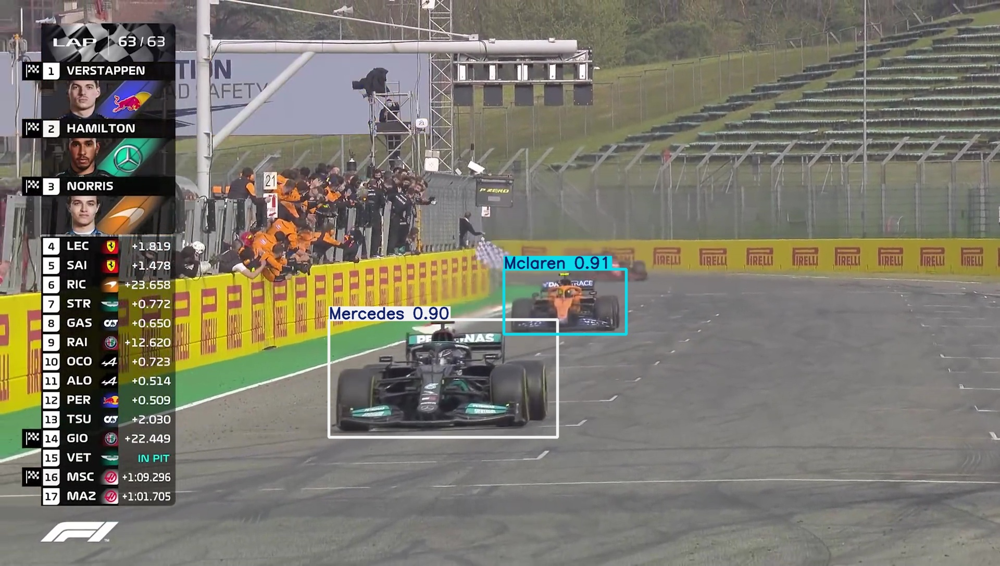

In [24]:
Image(filename='/content/yolov3/runs/detect/exp2/scene17901.jpg')
